In [3]:
import os
os.chdir('/data/l989o/deployed/a')
import sys
if '/data/l989o/a' in sys.path:
    sys.path.remove('/data/l989o/a')

In [4]:
import scanpy as sc
import anndata as ad

# Transformed dataset

In [2]:
from data import TransformedMeanDataset
from tqdm import tqdm
ds_train = TransformedMeanDataset('train')
ds_validation = TransformedMeanDataset('validation')
ds_test = TransformedMeanDataset('test')
from jupy import *

True
<KeysViewHDF5 ['count', 'maximum', 'mean', 'sum', 'variance']>


In [3]:
import torch
list_of_t = []
list_of_patient_index = []
for i, t in enumerate(tqdm(ds_train)):
    list_of_t.append(t)
    ii = torch.tensor([i] * len(t))
    list_of_patient_index.append(ii)
t_train = torch.cat(list_of_t, dim=0)
patient_indexes = torch.cat(list_of_patient_index)
print(t_train.shape)

100%|██████████| 389/389 [00:29<00:00, 13.29it/s]

torch.Size([762354, 39])


saving figure in data/spatial_uzh_processed/a/raw_data_bars.png


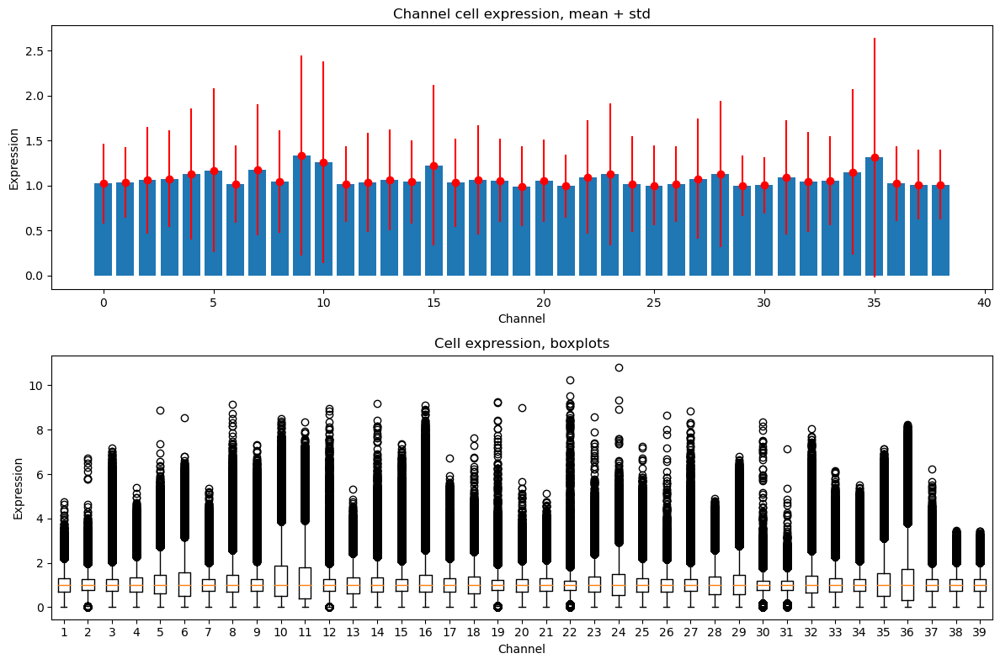

In [413]:
data = t_train

plt.figure(figsize=(12, 8))
plt.subplot(2, 1, 1)
plt.bar(list(range(39)), torch.mean(data, dim=0))
plt.errorbar(list(range(39)), torch.mean(data, dim=0), yerr=torch.std(data, dim=0), fmt='o', color='r')
plt.title('Channel cell expression, mean + std')
plt.xlabel('Channel')
plt.ylabel('Expression')
plt.subplot(2, 1, 2)
plt.boxplot(data.numpy())
plt.title('Cell expression, boxplots')
plt.xlabel('Channel')
plt.ylabel('Expression')
plt.tight_layout()
plt_show(plt, 'raw_data_bars.png')

In [204]:
a_train = ad.AnnData(t_train.numpy())
a_train

AnnData object with n_obs × n_vars = 762354 × 39

In [205]:
sc.tl.pca(a_train, svd_solver='arpack')

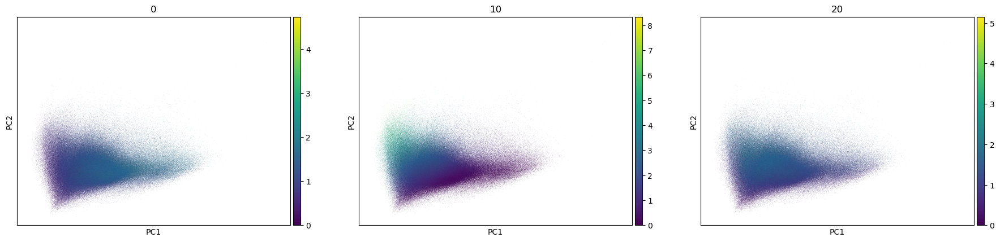

In [206]:
sc.pl.pca(a_train, color=['0', '10', '20'])

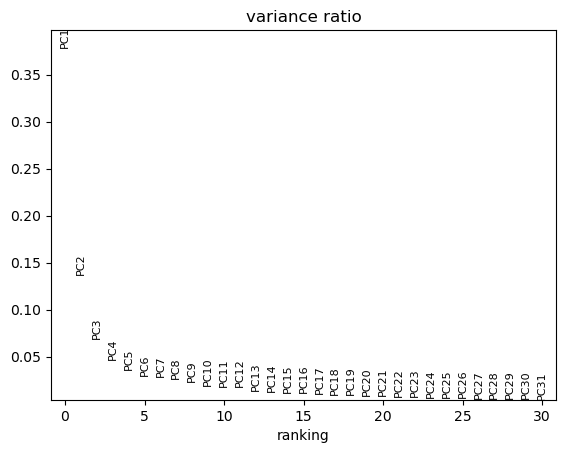

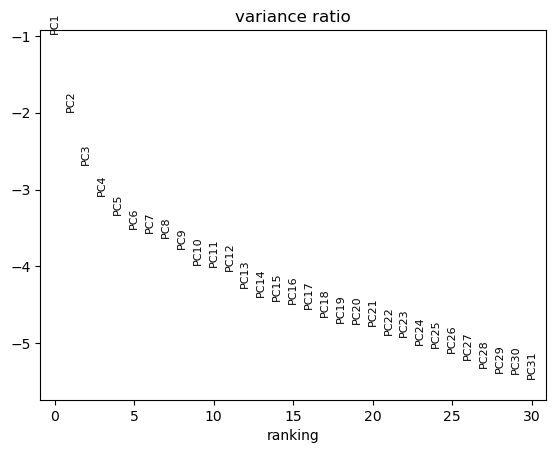

In [207]:
sc.pl.pca_variance_ratio(a_train)
sc.pl.pca_variance_ratio(a_train, log=True)

In [208]:
import numpy as np

random_choice = np.random.choice(len(a_train), 50000, replace=False)

a = a_train[random_choice, :].copy()
a

AnnData object with n_obs × n_vars = 50000 × 39
    uns: 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

In [209]:
sc.pp.neighbors(a)  #, n_neighbors=10, n_pcs=15)

In [210]:
sc.tl.leiden(a)  #, resolution=.5)

In [211]:
sc.tl.umap(a)

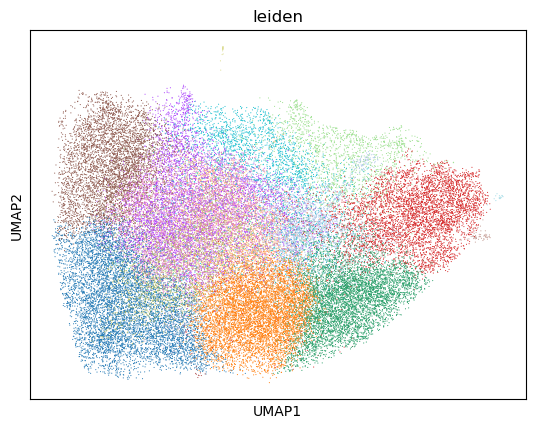

In [212]:
sc.pl.umap(a, color='leiden', legend_loc='on_data')

In [213]:
import phenograph

communities, _, _ = phenograph.cluster(a.X)

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 55.7477822303772 seconds
Jaccard graph constructed in 3.339531183242798 seconds
Wrote graph to binary file in 4.878703594207764 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.770855
After 3 runs, maximum modularity is Q = 0.772076
After 7 runs, maximum modularity is Q = 0.773633
Louvain completed 27 runs in 42.20312285423279 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 107.03828477859497 seconds


,leiden,phenograph
750910,5,7
645993,1,4
209879,3,8
522457,1,0
561056,9,10
...,...,...
60276,2,0
85150,0,9
371077,6,1
68515,5,7


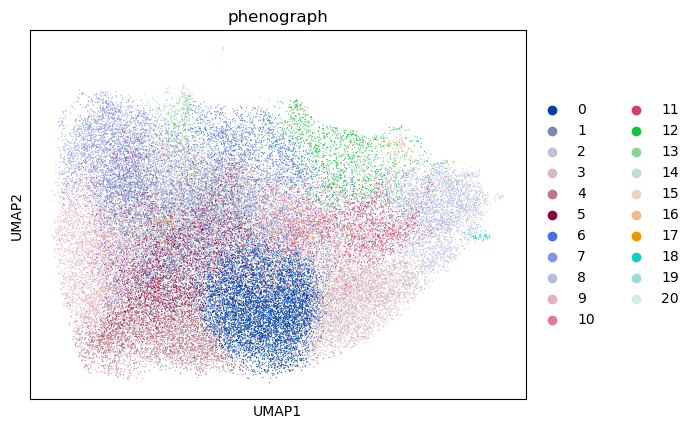

In [214]:
import pandas as pd
s = pd.Series(communities, dtype='category')
s.index = a.obs.index

a.obs['phenograph'] = s
display(a.obs)

sc.pl.umap(a, color='phenograph')

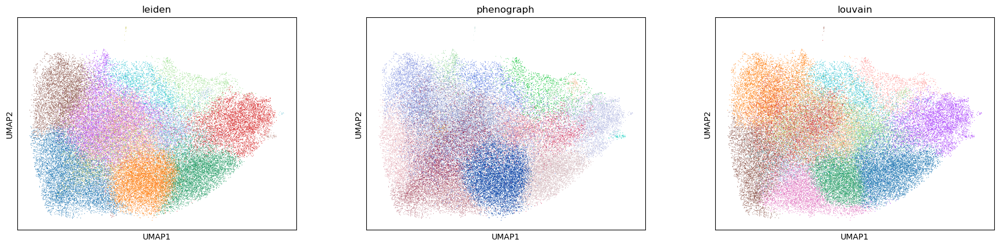

In [215]:
sc.tl.louvain(a)  #, resolution=.5)
sc.pl.umap(a, color=['leiden', 'phenograph', 'louvain'], legend_loc='on_data')

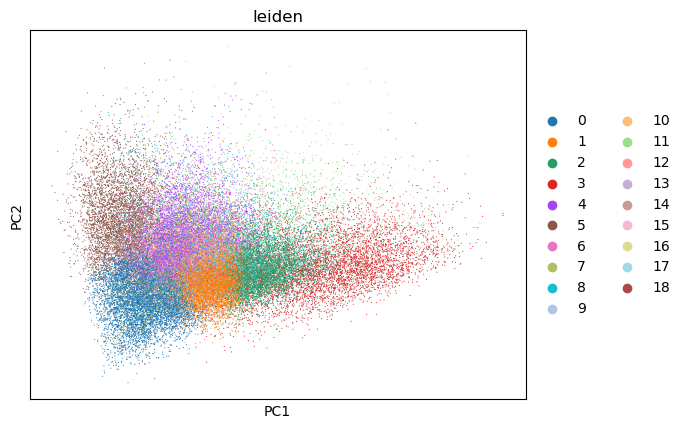

In [216]:
# sc.tl.pca(a)
sc.pl.pca(a, color=['leiden'])

In [217]:
print(patient_indexes[-10:])
print(len(patient_indexes))

tensor([388, 388, 388, 388, 388, 388, 388, 388, 388, 388])
762354


In [218]:
len(random_choice)
print(max(random_choice))
print(len(a_train))

762342
762354


In [219]:
aaaa = a

762354
50000
saving figure in data/spatial_uzh_processed/a/coloring_by_patient.png


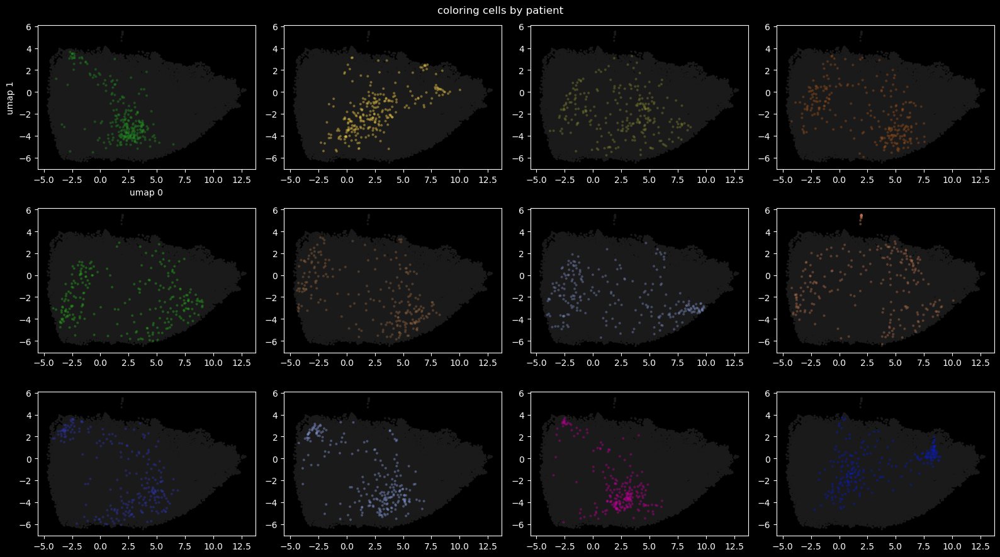

In [220]:
import pandas as pd
print(len(patient_indexes))
s = pd.Series(patient_indexes.numpy()[random_choice], dtype='category')
print(len(s))
s.index = aaaa.obs.index

aaaa.obs['patient'] = s
# display(b2.obs)

# sc.pl.umap(b2, color='patient')
u = aaaa.obsm['X_umap']
p = aaaa.obs['patient'].to_numpy()

random_colors = np.random.random((10000, 3))
c = random_colors[p, :]

plt.style.use('dark_background')

n = 12
c = 4
r = math.ceil(n / c)

fig, axes = plt.subplots(r, c, figsize=(c * 4, r * 3))
axes = axes.flatten()

unique, counts = np.unique(p, return_counts=True)
uu, cc = map(list, zip(*sorted(zip(unique, counts), key=lambda x: -x[1])))
top = uu[:n]

b = True
for i, t in enumerate(top):
    ax = axes[i]
    if b:
        b = False
        ax.set_xlabel('umap 0')
        ax.set_ylabel('umap 1')
    one_color = np.array([0.1, 0.1, 0.1, 1.]).reshape((1, 4))
    colors = np.tile(one_color, (len(u), 1))
    ax.scatter(u[:, 0], u[:, 1], c=colors, s=2)
    a = np.where(p == t)[0]
    colors[a, :3] = random_colors[t, :]
    colors[a, 3] = [0.3]
    ax.scatter(u[a, 0], u[a, 1], c=colors[a, :], s=4)
plt.suptitle('coloring cells by patient')
plt.tight_layout()
plt.style.use('default')
plt_show(plt, 'coloring_by_patient.png')

# Raw data

In [124]:
from data import RawMeanDataset
ds_train_raw = RawMeanDataset('train', filter_by_area=True)

import torch
list_of_t = []
for t in tqdm(ds_train_raw):
    list_of_t.append(t)
t_train_raw = torch.cat(list_of_t, dim=0)
print(t_train_raw.shape)

100%|██████████| 389/389 [00:30<00:00, 12.59it/s]

torch.Size([762354, 39])


In [125]:
a_train_raw = ad.AnnData(t_train_raw.numpy())

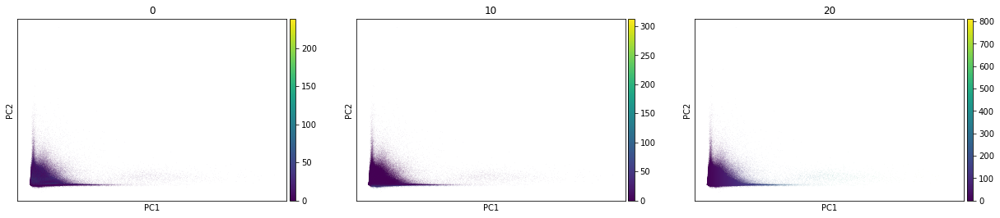

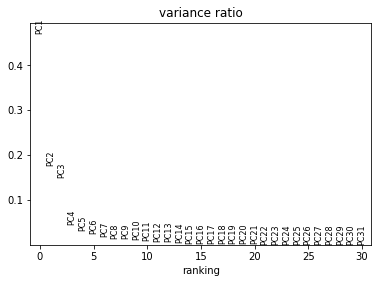

/data/l989o/miniconda3/envs/spatial_uzh_test/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:538: RuntimeWarning: divide by zero encountered in log
  scores = np.log(scores)


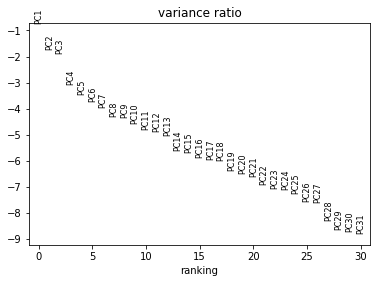

In [126]:
sc.tl.pca(a_train_raw, svd_solver='arpack')
sc.pl.pca(a_train_raw, color=['0', '10', '20'])
sc.pl.pca_variance_ratio(a_train_raw)
sc.pl.pca_variance_ratio(a_train_raw, log=True)

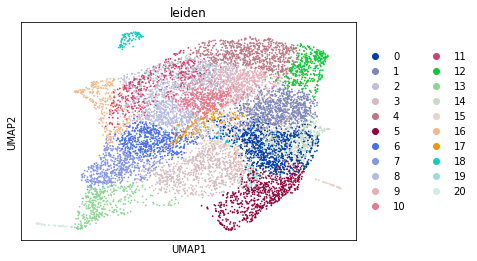

In [127]:
b = a_train_raw[random_choice, :].copy()
sc.pp.neighbors(b)  #, n_neighbors=10, n_pcs=15)
sc.tl.leiden(b)  #, resolution=.5)
sc.tl.umap(b)
sc.pl.umap(b, color='leiden')

# Dividing by quantile 0.99 for each channel, *each image*, arcsinh

In [397]:
import math
from tqdm import tqdm

ds = RawMeanDataset('train', filter_by_area=True)
list_of_z = []
i = 0
for i, x in enumerate(tqdm(ds)):
    q0 = np.quantile(x.numpy(), q=0.99, axis=0)
    x0 = x / q0
#    q1 = np.quantile(x0.numpy(), q=0.5, axis=0)
#    if all(q1 < 1e-5):
#        print(i - 1)
#    cofactor = q1 / math.sinh(1)
    z = np.arcsinh(x0)
    list_of_z.append(z)
t_train_raw2 = torch.cat(list_of_z, dim=0)

saving figure in data/spatial_uzh_processed/a/raw_data_bars.png


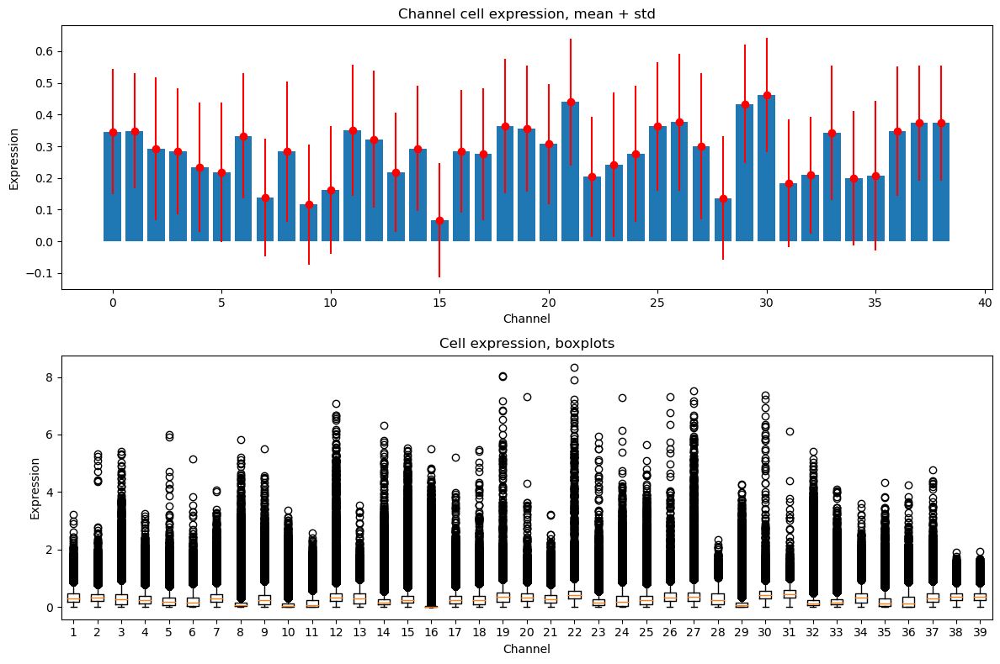

In [401]:
data = t_train_raw2

plt.figure(figsize=(12, 8))
plt.subplot(2, 1, 1)
plt.bar(list(range(39)), torch.mean(data, dim=0))
plt.errorbar(list(range(39)), torch.mean(data, dim=0), yerr=torch.std(data, dim=0), fmt='o', color='r')
plt.title('Channel cell expression, mean + std')
plt.xlabel('Channel')
plt.ylabel('Expression')
plt.subplot(2, 1, 2)
plt.boxplot(data.numpy())
plt.title('Cell expression, boxplots')
plt.xlabel('Channel')
plt.ylabel('Expression')
plt.tight_layout()
plt_show(plt, 'raw_data_bars.png')

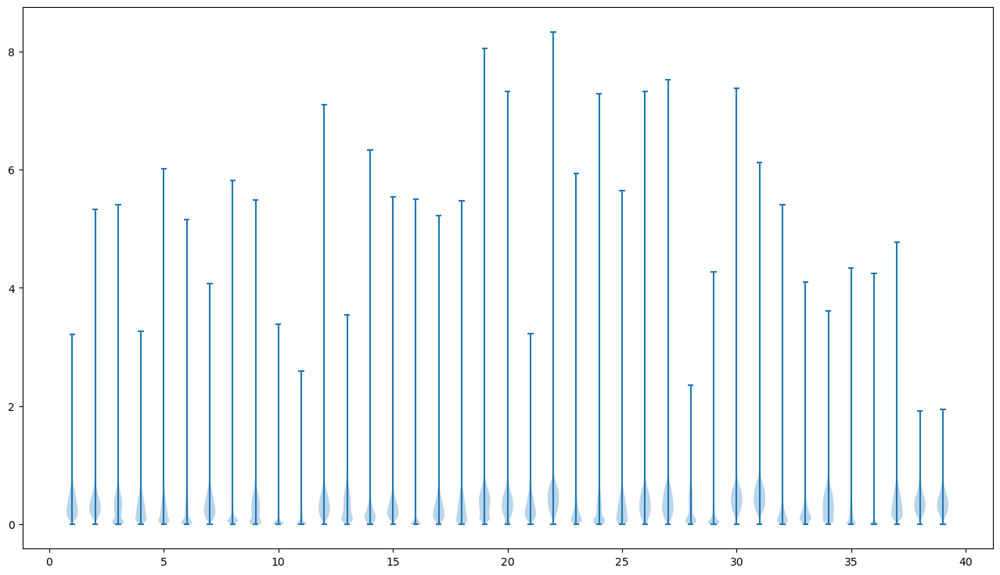

In [398]:
plt.figure(figsize=(16, 9))
plt.violinplot(t_train_raw2.numpy())
plt.show()

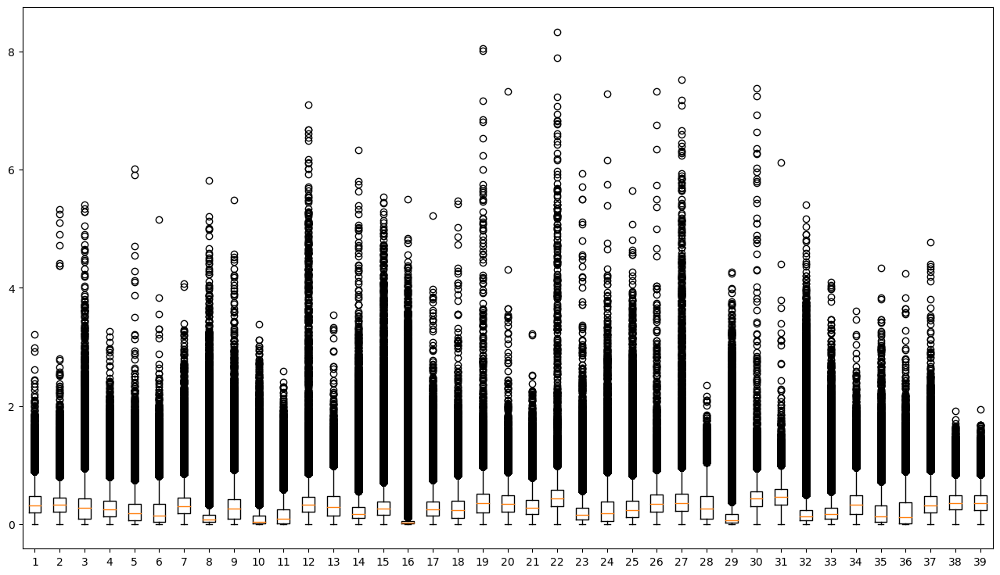

In [399]:
plt.figure(figsize=(16, 9))
plt.boxplot(t_train_raw2.numpy())
plt.show()

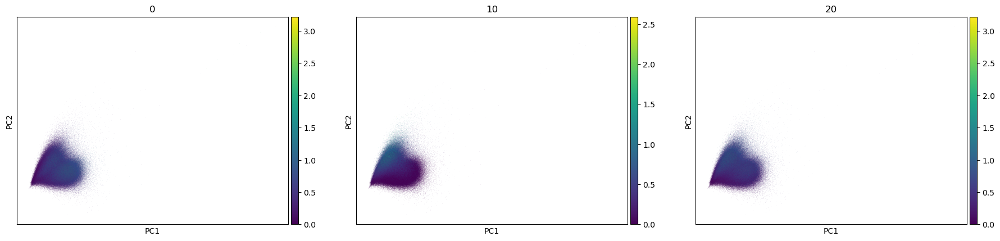

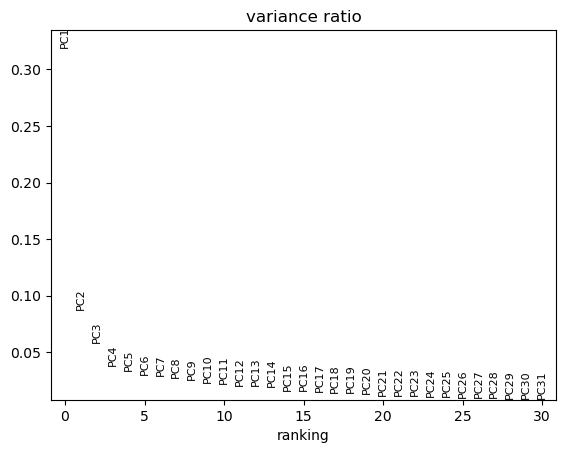

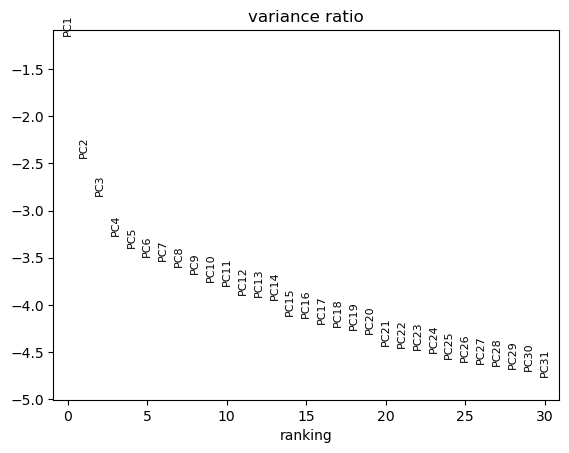

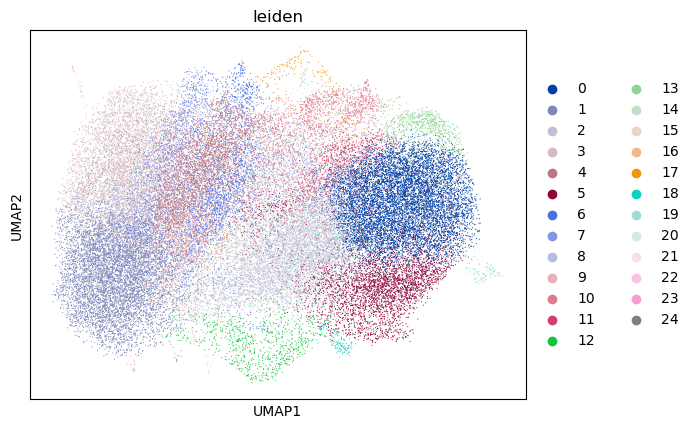

In [400]:
a_train_raw2 = ad.AnnData(t_train_raw2.numpy())
sc.tl.pca(a_train_raw2, svd_solver='arpack')
sc.pl.pca(a_train_raw2, color=['0', '10', '20'])
sc.pl.pca_variance_ratio(a_train_raw2)
sc.pl.pca_variance_ratio(a_train_raw2, log=True)
b2 = a_train_raw2[random_choice, :].copy()
sc.pp.neighbors(b2)  #, n_neighbors=10, n_pcs=15)
sc.tl.leiden(b2)  #, resolution=.5)
sc.tl.umap(b2)
sc.pl.umap(b2, color='leiden')

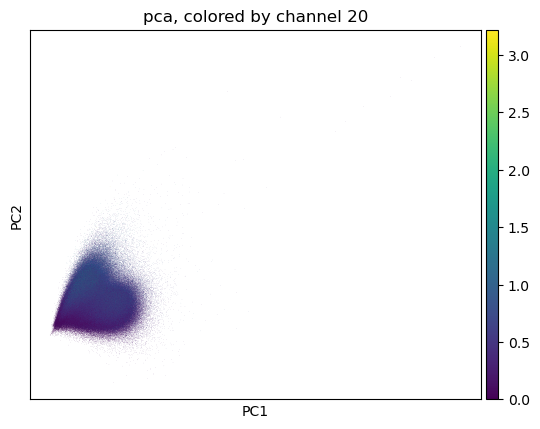

In [403]:
sc.pl.pca(a_train_raw2, color='20', show=False)
plt.title('pca, colored by channel 20')
plt.show()

762354
50000


,leiden,patient
750910,3,301
645993,2,217
209879,0,167
522457,0,189
561056,13,249
...,...,...
60276,5,179
85150,1,145
371077,4,123
68515,1,354


saving figure in data/spatial_uzh_processed/a/coloring_by_patient.png


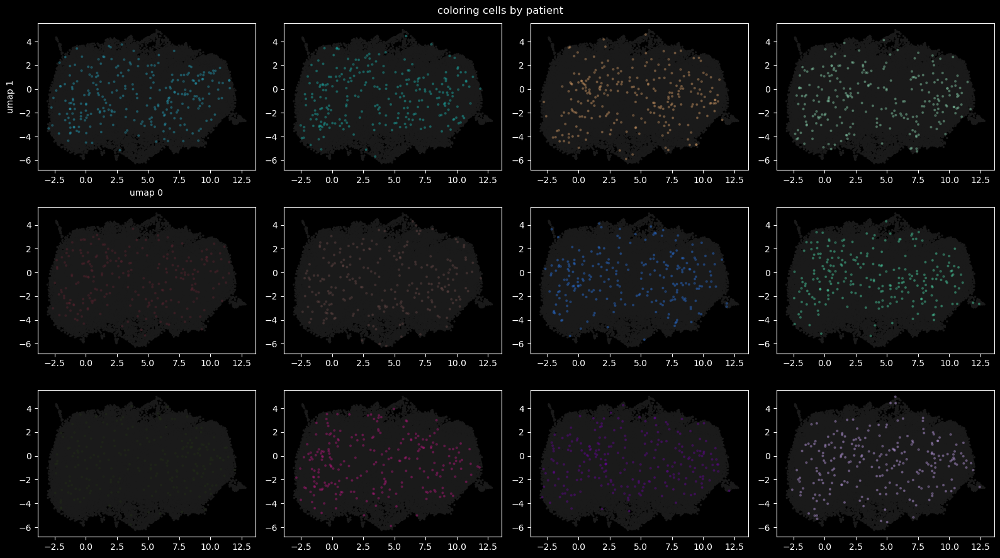

In [241]:
import pandas as pd
print(len(patient_indexes))
s = pd.Series(patient_indexes.numpy()[bigger_random_choice], dtype='category')
print(len(s))

s.index = b2.obs.index

b2.obs['patient'] = s
display(b2.obs)

# sc.pl.umap(b2, color='patient')

b2

s.index = b2.obs.index

b2.obs['patient'] = s
# display(b2.obs)

# sc.pl.umap(b2, color='patient')
u = b2.obsm['X_umap']
p = b2.obs['patient'].to_numpy()

random_colors = np.random.random((10000, 3))
c = random_colors[p, :]

plt.style.use('dark_background')

n = 12
c = 4
r = math.ceil(n / c)

fig, axes = plt.subplots(r, c, figsize=(c * 4, r * 3))
axes = axes.flatten()

unique, counts = np.unique(p, return_counts=True)
uu, cc = map(list, zip(*sorted(zip(unique, counts), key=lambda x: -x[1])))
top = uu[:n]

b = True
for i, t in enumerate(top):
    ax = axes[i]
    if b:
        b = False
        ax.set_xlabel('umap 0')
        ax.set_ylabel('umap 1')
    one_color = np.array([0.1, 0.1, 0.1, 1.]).reshape((1, 4))
    colors = np.tile(one_color, (len(u), 1))
    ax.scatter(u[:, 0], u[:, 1], c=colors, s=2)
    a = np.where(p == t)[0]
    colors[a, :3] = random_colors[t, :]
    colors[a, 3] = [0.3]
    ax.scatter(u[a, 0], u[a, 1], c=colors[a, :], s=4)
plt.suptitle('coloring cells by patient')
plt.tight_layout()
plt.style.use('default')
plt_show(plt, 'coloring_by_patient.png')

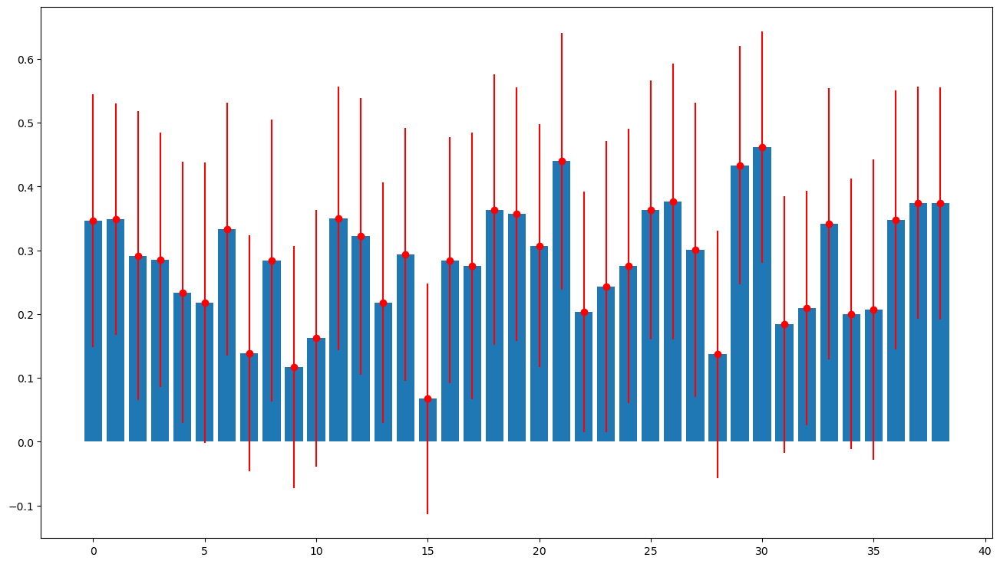

In [256]:
plt.figure(figsize=(16, 9))
plt.bar(list(range(39)), torch.mean(t_train_raw2, dim=0))
plt.errorbar(list(range(39)), torch.mean(t_train_raw2, dim=0), yerr=torch.std(t_train_raw2, dim=0), fmt='o', color='r')
plt.show()

# Dividing by quantile 0.99 for each channel, *each image*

In [395]:
import math
from tqdm import tqdm
from data import RawMeanDataset

ds = RawMeanDataset('train', filter_by_area=True)
list_of_z = []
i = 0
list_of_patient_index = []
for i, x in enumerate(tqdm(ds)):
    q0 = np.quantile(x.numpy(), q=0.99, axis=0)
    x0 = x / q0
#    q1 = np.quantile(x0.numpy(), q=0.5, axis=0)
#    if all(q1 < 1e-5):
#        print(i - 1)
#    cofactor = q1 / math.sinh(1)
    z = x0
    ii = torch.tensor([i] * len(x))
#    z = np.arcsinh(x0)
    list_of_patient_index.append(ii)
    list_of_z.append(z)
t_train_raw2 = torch.cat(list_of_z, dim=0)
patient_indexes = torch.cat(list_of_patient_index)

100%|██████████| 389/389 [00:31<00:00, 12.40it/s]


saving figure in data/spatial_uzh_processed/a/raw_data_bars.png


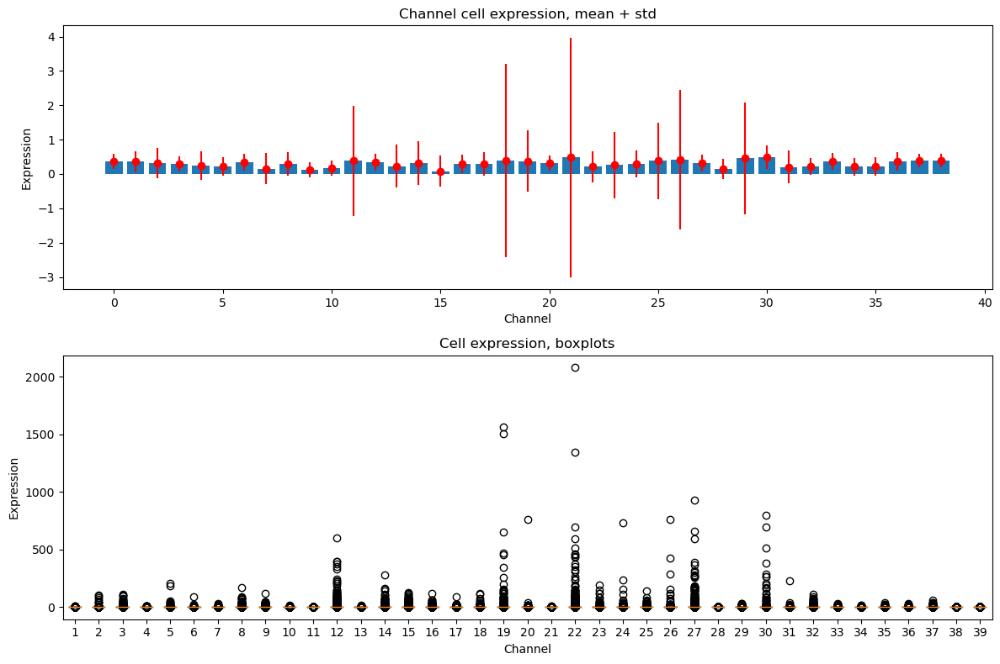

In [396]:
data = t_train_raw2

plt.figure(figsize=(12, 8))
plt.subplot(2, 1, 1)
plt.bar(list(range(39)), torch.mean(data, dim=0))
plt.errorbar(list(range(39)), torch.mean(data, dim=0), yerr=torch.std(data, dim=0), fmt='o', color='r')
plt.title('Channel cell expression, mean + std')
plt.xlabel('Channel')
plt.ylabel('Expression')
plt.subplot(2, 1, 2)
plt.boxplot(data.numpy())
plt.title('Cell expression, boxplots')
plt.xlabel('Channel')
plt.ylabel('Expression')
plt.tight_layout()
plt_show(plt, 'raw_data_bars.png')

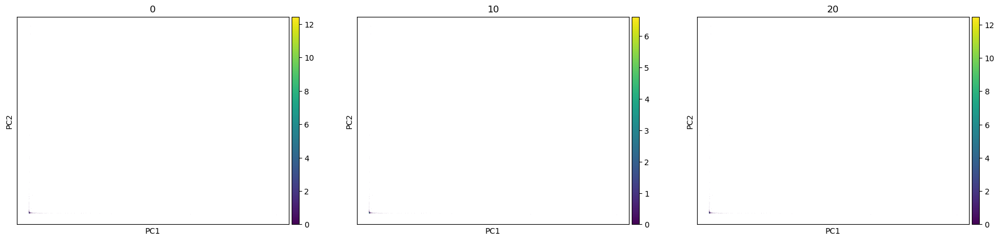

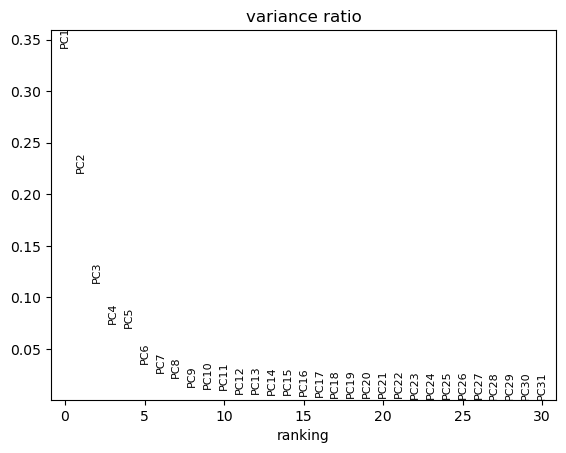

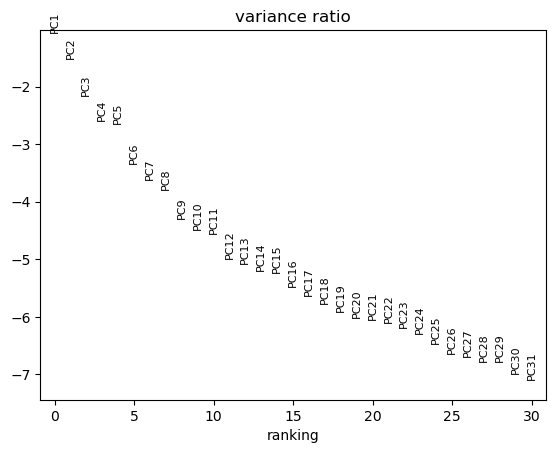

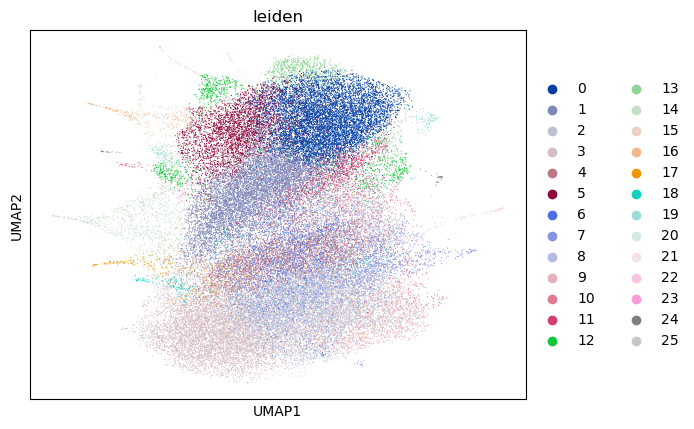

In [354]:
a_train_raw2 = ad.AnnData(t_train_raw2.numpy())
sc.tl.pca(a_train_raw2, svd_solver='arpack')
sc.pl.pca(a_train_raw2, color=['0', '10', '20'])
sc.pl.pca_variance_ratio(a_train_raw2)
sc.pl.pca_variance_ratio(a_train_raw2, log=True)
b2 = a_train_raw2[random_choice, :].copy()
sc.pp.neighbors(b2)  #, n_neighbors=10, n_pcs=15)
sc.tl.leiden(b2)  #, resolution=.5)
sc.tl.umap(b2)
sc.pl.umap(b2, color='leiden')

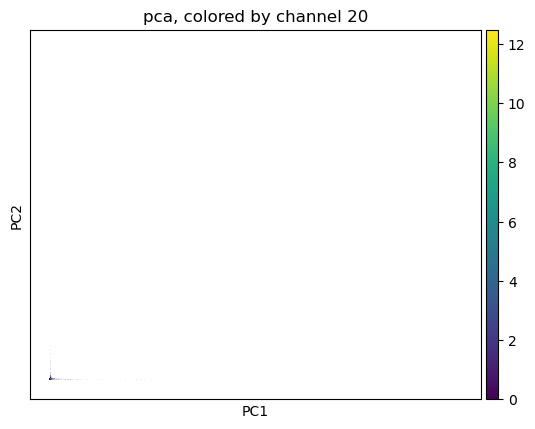

In [359]:
sc.pl.pca(a_train_raw2, color='20', show=False)
plt.title('pca, colored by channel 20')
plt.show()

In [355]:
import pandas as pd
print(len(patient_indexes))
s = pd.Series(patient_indexes.numpy()[bigger_random_choice], dtype='category')
print(len(s))

s.index = b2.obs.index

b2.obs['patient'] = s
display(b2.obs)

# sc.pl.umap(b2, color='patient')

b2

762354
50000


,leiden,patient
750910,9,300
645993,1,33
209879,1,359
522457,11,311
561056,13,245
...,...,...
60276,5,125
85150,3,160
371077,7,127
68515,3,64


AnnData object with n_obs × n_vars = 50000 × 39
    obs: 'leiden', 'patient'
    uns: 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [356]:
u = b2.obsm['X_umap']
p = b2.obs['patient'].to_numpy()

random_colors = np.random.random((10000, 3))
c = random_colors[p, :]

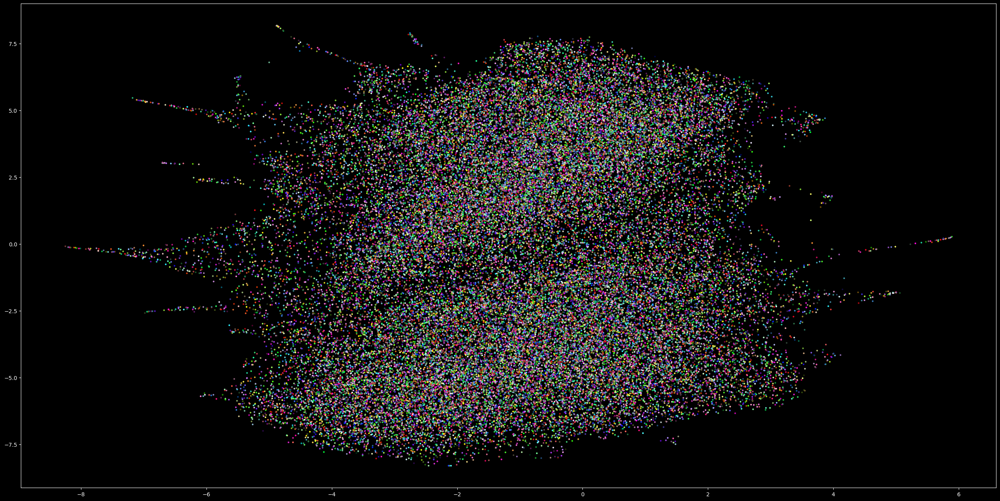

In [357]:
import matplotlib.pyplot as plt
plt.style.use('dark_background')
plt.figure(figsize=(32, 16))
plt.scatter(u[:, 0], u[:, 1], c=c, s=4)
plt.show()
plt.style.use('default')

saving figure in data/spatial_uzh_processed/a/coloring_by_patient.png


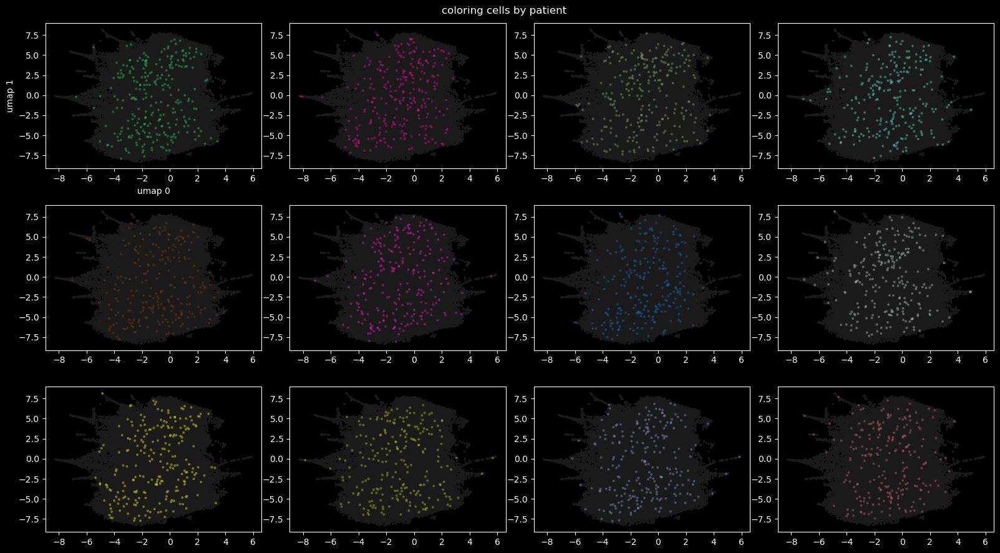

In [358]:
plt.style.use('dark_background')

n = 12
c = 4
r = math.ceil(n / c)

fig, axes = plt.subplots(r, c, figsize=(c * 4, r * 3))
axes = axes.flatten()

unique, counts = np.unique(p, return_counts=True)
uu, cc = map(list, zip(*sorted(zip(unique, counts), key=lambda x: -x[1])))
top = uu[:n]

b = True
for i, t in enumerate(top):
    ax = axes[i]
    if b:
        b = False
        ax.set_xlabel('umap 0')
        ax.set_ylabel('umap 1')
    one_color = np.array([0.1, 0.1, 0.1, 1.]).reshape((1, 4))
    colors = np.tile(one_color, (len(u), 1))
    ax.scatter(u[:, 0], u[:, 1], c=colors, s=2)
    a = np.where(p == t)[0]
    colors[a, :3] = random_colors[t, :]
    colors[a, 3] = [0.3]
    ax.scatter(u[a, 0], u[a, 1], c=colors[a, :], s=4)
plt.suptitle('coloring cells by patient')
plt.tight_layout()
plt.style.use('default')
plt_show(plt, 'coloring_by_patient.png')

# Raw data (again)

In [378]:
import math
from tqdm import tqdm
from data import RawMeanDataset

ds = RawMeanDataset('train', filter_by_area=True)
list_of_z = []
i = 0
list_of_patient_index = []
for i, x in enumerate(tqdm(ds)):
#    q1 = np.quantile(x0.numpy(), q=0.5, axis=0)
#    if all(q1 < 1e-5):
#        print(i - 1)
#    cofactor = q1 / math.sinh(1)
    ii = torch.tensor([i] * len(x))
#    z = np.arcsinh(x0)
    list_of_z.append(x)
    list_of_patient_index.append(ii)
t_train_raw2 = torch.cat(list_of_z, dim=0)
patient_indexes = torch.cat(list_of_patient_index)

100%|██████████| 389/389 [00:30<00:00, 12.69it/s]


saving figure in data/spatial_uzh_processed/a/raw_data_bars.png


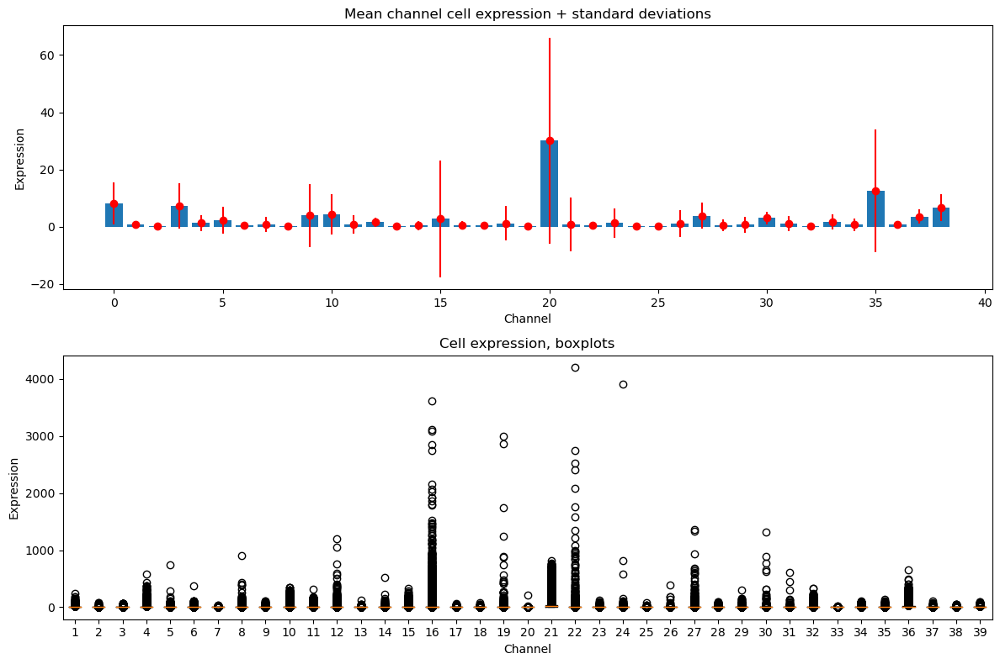

In [390]:
data = t_train_raw2

plt.figure(figsize=(12, 8))
plt.subplot(2, 1, 1)
plt.bar(list(range(39)), torch.mean(data, dim=0))
plt.errorbar(list(range(39)), torch.mean(data, dim=0), yerr=torch.std(data, dim=0), fmt='o', color='r')
plt.title('Mean channel cell expression + standard deviations')
plt.xlabel('Channel')
plt.ylabel('Expression')
plt.subplot(2, 1, 2)
plt.boxplot(data.numpy())
plt.title('Cell expression, boxplots')
plt.xlabel('Channel')
plt.ylabel('Expression')
plt.tight_layout()
plt_show(plt, 'raw_data_bars.png')

In [327]:
a_train_raw2 = ad.AnnData(t_train_raw2.numpy())
plt.style.use('default')
sc.tl.pca(a_train_raw2, svd_solver='arpack')
sc.pl.pca(a_train_raw2, color=['0', '10', '20'], show=False)
plt.suptitle('raw data, pca, channels 0, 10, 20')
plt.show()
sc.pl.pca_variance_ratio(a_train_raw2, show=False)
ax = plt.gca()
ax.set_title('raw data, pca variance ratio')
plt.show()
sc.pl.pca_variance_ratio(a_train_raw2, log=True)

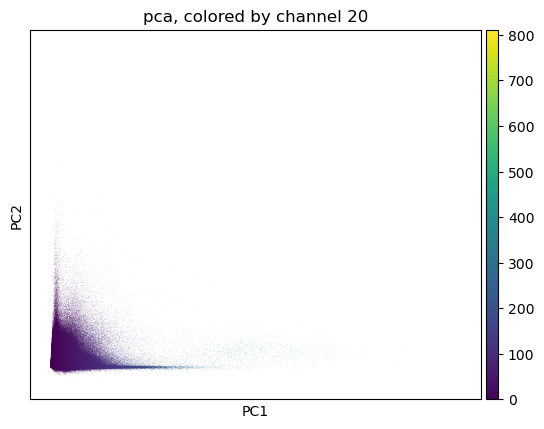

In [334]:
sc.pl.pca(a_train_raw2, color='20', show=False)
plt.title('pca, colored by channel 20')
plt.show()

In [316]:
bigger_random_choice = np.random.choice(len(a_train), 50000, replace=False)
b2 = a_train_raw2[bigger_random_choice, :].copy()
sc.pp.neighbors(b2)  #, n_neighbors=10, n_pcs=15)
sc.tl.leiden(b2)  #, resolution=.5)
sc.tl.umap(b2)

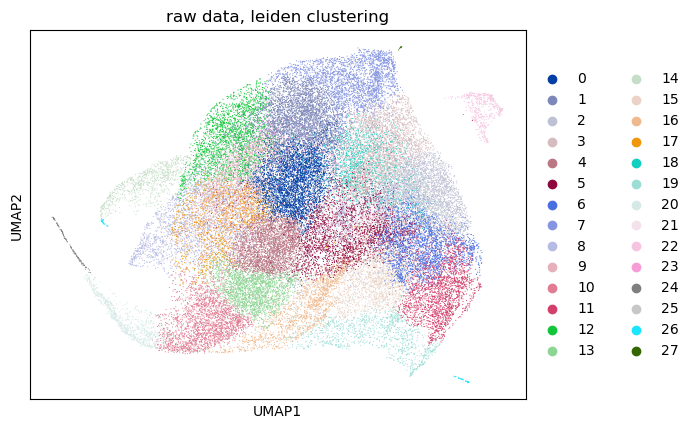

In [317]:
sc.pl.umap(b2, color='leiden', show=False)
ax = plt.gca()
ax.set_title('raw data, leiden clustering')
plt.show()

762354
50000


,leiden,patient
628294,15,300
76524,2,33
718162,9,359
646402,7,311
546885,3,245
...,...,...
292607,18,125
377416,11,160
298365,11,127
148802,12,64


saving figure in data/spatial_uzh_processed/a/coloring_by_patient.png


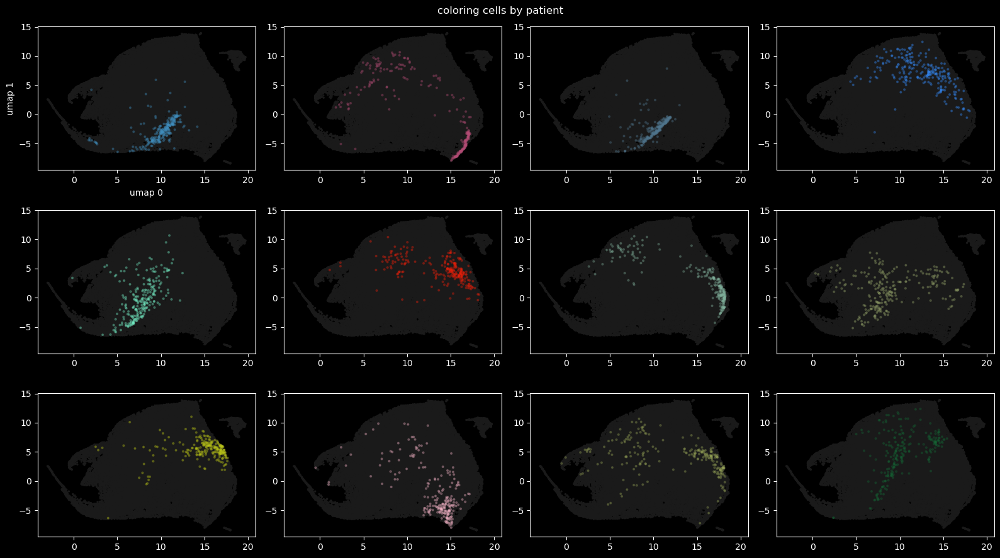

In [318]:
import pandas as pd
print(len(patient_indexes))
s = pd.Series(patient_indexes.numpy()[bigger_random_choice], dtype='category')
print(len(s))

s.index = b2.obs.index

b2.obs['patient'] = s
display(b2.obs)

# sc.pl.umap(b2, color='patient')

b2

s.index = b2.obs.index

b2.obs['patient'] = s
# display(b2.obs)

# sc.pl.umap(b2, color='patient')
u = b2.obsm['X_umap']
p = b2.obs['patient'].to_numpy()

random_colors = np.random.random((10000, 3))
c = random_colors[p, :]

plt.style.use('dark_background')

n = 12
c = 4
r = math.ceil(n / c)

fig, axes = plt.subplots(r, c, figsize=(c * 4, r * 3))
axes = axes.flatten()

unique, counts = np.unique(p, return_counts=True)
uu, cc = map(list, zip(*sorted(zip(unique, counts), key=lambda x: -x[1])))
top = uu[:n]

b = True
for i, t in enumerate(top):
    ax = axes[i]
    if b:
        b = False
        ax.set_xlabel('umap 0')
        ax.set_ylabel('umap 1')
    one_color = np.array([0.1, 0.1, 0.1, 1.]).reshape((1, 4))
    colors = np.tile(one_color, (len(u), 1))
    ax.scatter(u[:, 0], u[:, 1], c=colors, s=2)
    a = np.where(p == t)[0]
    colors[a, :3] = random_colors[t, :]
    colors[a, 3] = [0.3]
    ax.scatter(u[a, 0], u[a, 1], c=colors[a, :], s=4)
plt.suptitle('coloring cells by patient')
plt.tight_layout()
plt.style.use('default')
plt_show(plt, 'coloring_by_patient.png')

# Normalization from the paper (0.99 quantile for each channel)

In [392]:
import math
from tqdm import tqdm
from data import RawMeanDataset

ds = RawMeanDataset('train', filter_by_area=True)
list_of_z = []
i = 0
list_of_patient_index = []
for i, x in enumerate(tqdm(ds)):
#    q1 = np.quantile(x0.numpy(), q=0.5, axis=0)
#    if all(q1 < 1e-5):
#        print(i - 1)
#    cofactor = q1 / math.sinh(1)
    ii = torch.tensor([i] * len(x))
#    z = np.arcsinh(x0)
    list_of_z.append(x)
    list_of_patient_index.append(ii)
t_train_raw2 = torch.cat(list_of_z, dim=0)
patient_indexes = torch.cat(list_of_patient_index)
q = np.quantile(t_train_raw2.numpy(), 0.99, axis=0)
t_train_raw2 /= q

100%|██████████| 389/389 [00:32<00:00, 11.99it/s]


saving figure in data/spatial_uzh_processed/a/raw_data_bars.png


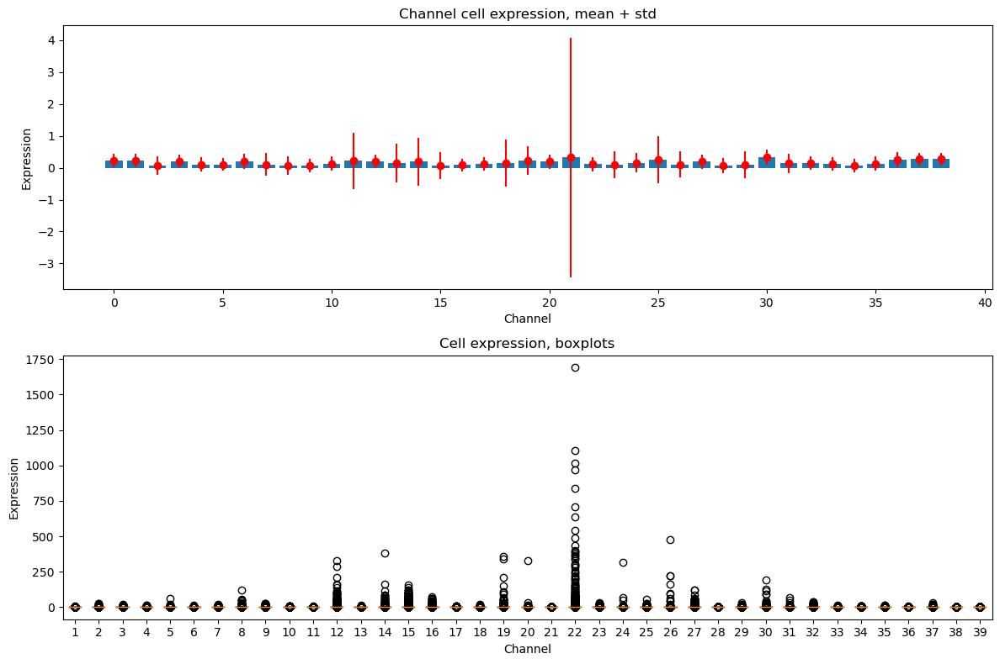

In [393]:
data = t_train_raw2

plt.figure(figsize=(12, 8))
plt.subplot(2, 1, 1)
plt.bar(list(range(39)), torch.mean(data, dim=0))
plt.errorbar(list(range(39)), torch.mean(data, dim=0), yerr=torch.std(data, dim=0), fmt='o', color='r')
plt.title('Channel cell expression, mean + std')
plt.xlabel('Channel')
plt.ylabel('Expression')
plt.subplot(2, 1, 2)
plt.boxplot(data.numpy())
plt.title('Cell expression, boxplots')
plt.xlabel('Channel')
plt.ylabel('Expression')
plt.tight_layout()
plt_show(plt, 'raw_data_bars.png')

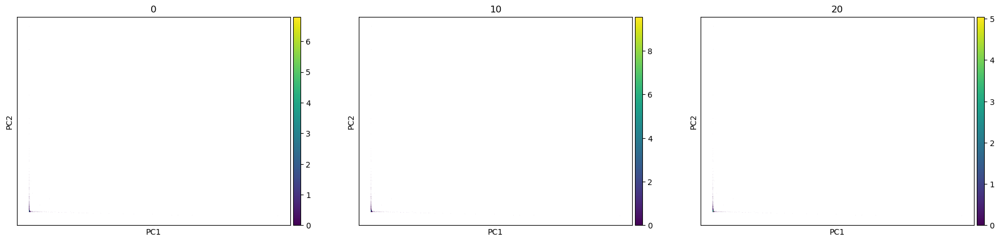

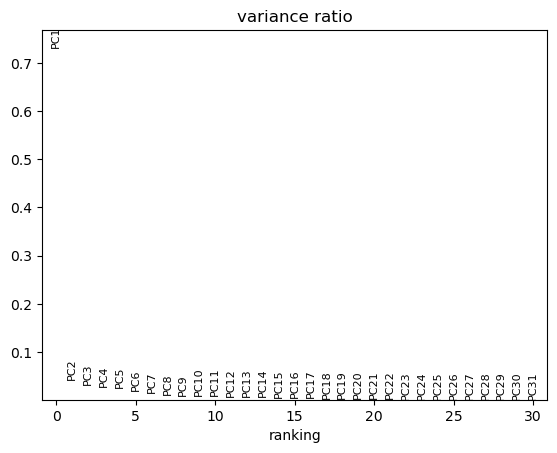

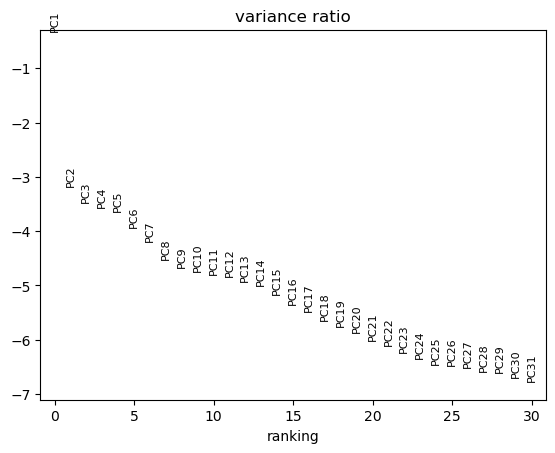

In [344]:
a_train_raw2 = ad.AnnData(t_train_raw2.numpy())
plt.style.use('default')
sc.tl.pca(a_train_raw2, svd_solver='arpack')
sc.pl.pca(a_train_raw2, color=['0', '10', '20'])
sc.pl.pca_variance_ratio(a_train_raw2)
sc.pl.pca_variance_ratio(a_train_raw2, log=True)

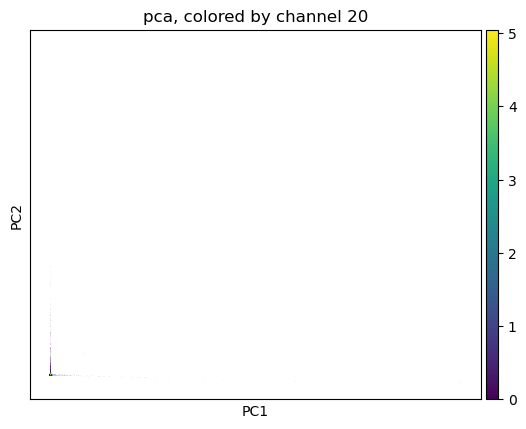

In [345]:
sc.pl.pca(a_train_raw2, color='20', show=False)
plt.title('pca, colored by channel 20')
plt.show()

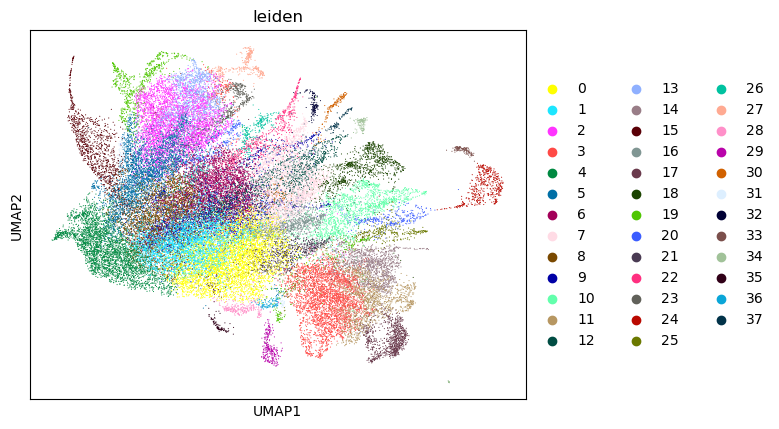

In [226]:
bigger_random_choice = np.random.choice(len(a_train), 50000, replace=False)
b2 = a_train_raw2[bigger_random_choice, :].copy()
sc.pp.neighbors(b2)  #, n_neighbors=10, n_pcs=15)
sc.tl.leiden(b2)  #, resolution=.5)
sc.tl.umap(b2)
sc.pl.umap(b2, color='leiden')

762354
50000


,leiden,patient
623169,11,298
448331,6,193
761956,3,388
390537,2,165
719541,12,360
...,...,...
42368,5,18
396905,8,167
709636,14,355
159983,4,69


saving figure in data/spatial_uzh_processed/a/coloring_by_patient.png


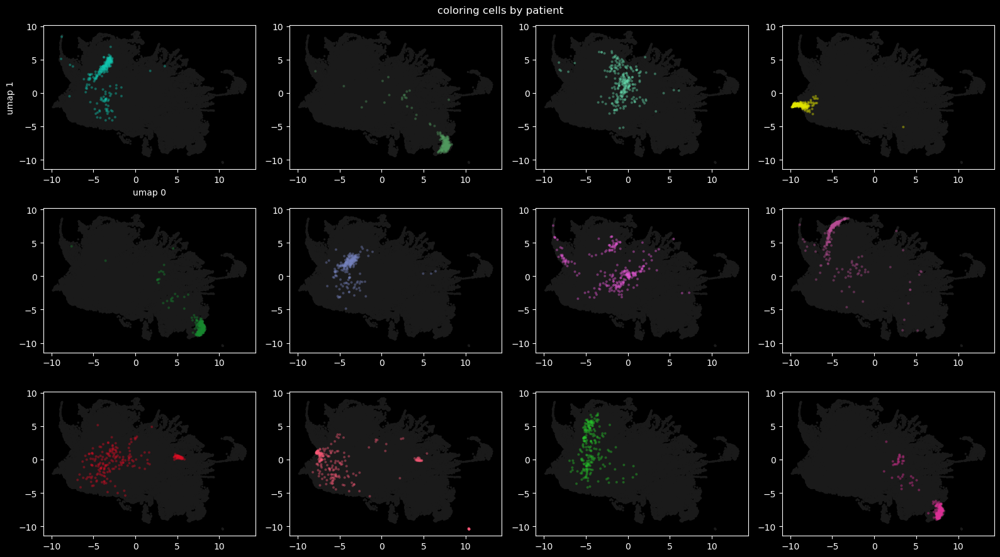

In [227]:
import pandas as pd
print(len(patient_indexes))
s = pd.Series(patient_indexes.numpy()[bigger_random_choice], dtype='category')
print(len(s))

s.index = b2.obs.index

b2.obs['patient'] = s
display(b2.obs)

# sc.pl.umap(b2, color='patient')

b2

s.index = b2.obs.index

b2.obs['patient'] = s
# display(b2.obs)

# sc.pl.umap(b2, color='patient')
u = b2.obsm['X_umap']
p = b2.obs['patient'].to_numpy()

random_colors = np.random.random((10000, 3))
c = random_colors[p, :]

plt.style.use('dark_background')

n = 12
c = 4
r = math.ceil(n / c)

fig, axes = plt.subplots(r, c, figsize=(c * 4, r * 3))
axes = axes.flatten()

unique, counts = np.unique(p, return_counts=True)
uu, cc = map(list, zip(*sorted(zip(unique, counts), key=lambda x: -x[1])))
top = uu[:n]

b = True
for i, t in enumerate(top):
    ax = axes[i]
    if b:
        b = False
        ax.set_xlabel('umap 0')
        ax.set_ylabel('umap 1')
    one_color = np.array([0.1, 0.1, 0.1, 1.]).reshape((1, 4))
    colors = np.tile(one_color, (len(u), 1))
    ax.scatter(u[:, 0], u[:, 1], c=colors, s=2)
    a = np.where(p == t)[0]
    colors[a, :3] = random_colors[t, :]
    colors[a, 3] = [0.3]
    ax.scatter(u[a, 0], u[a, 1], c=colors[a, :], s=4)
plt.suptitle('coloring cells by patient')
plt.tight_layout()
plt.style.use('default')
plt_show(plt, 'coloring_by_patient.png')

# centering at q 0.5 and scaling at q 0.99, asinh

In [268]:
SPLIT = 'train'
# SPLIT = 'validation'
# SPLIT = 'test'

import math
from tqdm import tqdm

ds = RawMeanDataset(SPLIT, filter_by_area=True)
list_of_x = []
list_of_z = []
list_of_patient_index = []
i = 0
d = {}
for i, x in enumerate(tqdm(ds)):
    # if i > 20:
    #     break
    # std = torch.std(x, dim=0)
    # x_scaled = x / std
    q0 = np.quantile(x.numpy(), q=0.99, axis=0)
    x0 = x / q0
    q1 = np.quantile(x0.numpy(), q=0.5, axis=0)
    if all(q1 < 1e-5):
        print(i - 1)
    cofactor = q1 / math.sinh(1)
    z = np.arcsinh(x0 / cofactor)
    list_of_z.append(z)
    list_of_x.append(x)
    o = ds.filenames[i]
    d[o] = {'q0': q0, 'q1': q1}
    ii = torch.tensor([i] * len(t))
    list_of_patient_index.append(ii)
z_train = torch.cat(list_of_z, dim=0)
patient_indexes = torch.cat(list_of_patient_index)

100%|██████████| 389/389 [00:33<00:00, 11.65it/s]


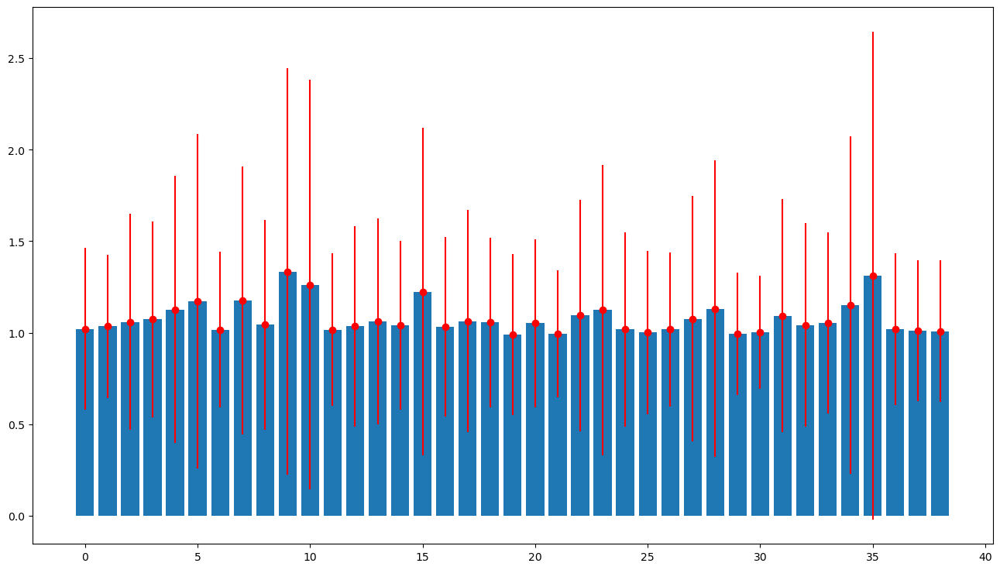

In [269]:
plt.figure(figsize=(16, 9))
plt.bar(list(range(39)), torch.mean(z_train, dim=0))
plt.errorbar(list(range(39)), torch.mean(z_train, dim=0), yerr=torch.std(z_train, dim=0), fmt='o', color='r')
plt.show()

In [267]:
z_train55 = z_train

In [270]:
z_train99 = z_train

In [276]:
print(z_train55.shape)
print(z_train99.shape)
print(z_train55[0, :])
print(z_train99[0, :])

torch.Size([762354, 39])
torch.Size([762354, 39])
tensor([0.4210, 0.4997, 0.0000, 1.1694, 0.5967, 0.0819, 0.6926, 0.4223, 0.5798,
        0.4838, 0.0000, 0.1640, 0.3443, 0.5538, 0.6291, 0.4040, 0.4900, 0.0000,
        0.5322, 0.4152, 0.5587, 0.6039, 1.2465, 0.6869, 0.3211, 1.1699, 0.6932,
        0.2664, 0.7663, 0.7418, 0.5450, 0.0000, 0.0000, 0.5328, 0.4035, 0.0416,
        0.8221, 0.4235, 0.2623], dtype=torch.float64)
tensor([0.4210, 0.4997, 0.0000, 1.1694, 0.5967, 0.0819, 0.6926, 0.4223, 0.5798,
        0.4838, 0.0000, 0.1640, 0.3443, 0.5538, 0.6291, 0.4040, 0.4900, 0.0000,
        0.5322, 0.4152, 0.5587, 0.6039, 1.2465, 0.6869, 0.3211, 1.1699, 0.6932,
        0.2664, 0.7663, 0.7418, 0.5450, 0.0000, 0.0000, 0.5328, 0.4035, 0.0416,
        0.8221, 0.4235, 0.2623], dtype=torch.float64)


In [285]:
x = ds[0]
q99 = np.quantile(x.numpy(), q=0.99, axis=0)
q55 = np.quantile(x.numpy(), q=0.55, axis=0)
x99 = x / q99
x55 = x / q55

q50_99 = np.quantile(x99.numpy(), q=0.5, axis=0)
q50_55 = np.quantile(x55.numpy(), q=0.5, axis=0)
cofactor99 = q50_99 / math.asinh(1)
cofactor55 = q50_55 / math.asinh(1)
print(cofactor99)
print(cofactor55)

z99 = np.arcsinh(x99 / cofactor99)
z55 = np.arcsinh(x55 / cofactor55)
print(z99.shape, z55.shape)
print(z99[0, :])
print(z55[0, :])
# similar! dividing by q99 brings q50 close!

[0.37711417 0.45301738 0.40288861 0.41787569 0.26507149 0.17210308
 0.31140634 0.07715357 0.31541904 0.01031157 0.00405067 0.13252122
 0.26331724 0.14125956 0.37932734 0.01389885 0.31412834 0.20463457
 0.55476287 0.359978   0.1944023  0.49510705 0.11814492 0.28383108
 0.26748284 0.38172328 0.48390083 0.3864648  0.13605981 0.45693858
 0.59484083 0.22901811 0.13134612 0.44031439 0.24451318 0.21826976
 0.31012917 0.37012916 0.37081237]
[1.07022102 1.08351774 1.07752587 1.07357076 1.05114282 0.98508432
 1.06040378 1.02269006 1.05604998 0.94812251 0.84779814 1.05600118
 1.02407255 1.02717955 1.06058011 1.0049711  1.06316987 0.99733629
 1.08842508 1.04760344 1.06687868 1.08260517 1.05724673 1.02839383
 1.03691984 1.07012758 1.07734863 1.03779797 1.02645186 1.07674547
 1.09479374 1.0354486  1.02390093 1.07076586 1.03098622 0.9638888
 1.06742289 1.04818551 1.05694783]
torch.Size([1824, 39]) torch.Size([1824, 39])
tensor([0.3197, 0.3813, 0.0000, 0.9443, 0.4584, 0.0615, 0.5360, 0.3207, 0.4448,
 

# Raw data + asinh (normalization 12)

In [404]:
SPLIT = 'train'
# SPLIT = 'validation'
# SPLIT = 'test'

import math
from tqdm import tqdm

ds = RawMeanDataset(SPLIT, filter_by_area=True)
list_of_x = []
list_of_z = []
list_of_patient_index = []
i = 0
d = {}
for i, x in enumerate(tqdm(ds)):
    z = np.arcsinh(x)
    list_of_z.append(z)
    ii = torch.tensor([i] * len(x))
    list_of_patient_index.append(ii)
z_train = torch.cat(list_of_z, dim=0)
patient_indexes = torch.cat(list_of_patient_index, dim=0)

100%|██████████| 389/389 [00:33<00:00, 11.78it/s]


In [405]:
len(patient_indexes)

762354

saving figure in data/spatial_uzh_processed/a/raw_data_bars.png


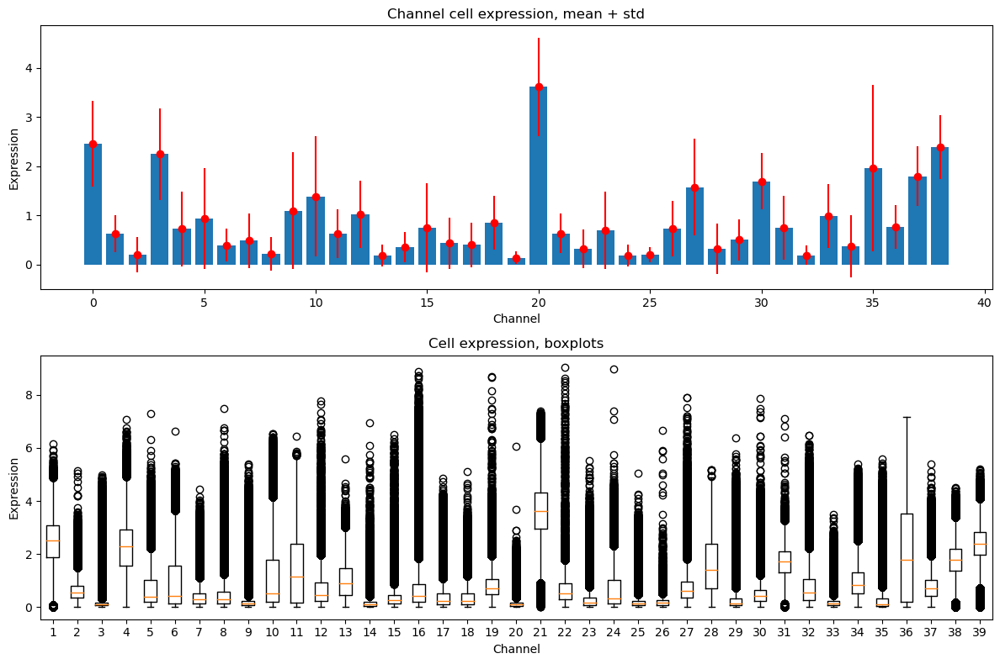

In [406]:
data = z_train

plt.figure(figsize=(12, 8))
plt.subplot(2, 1, 1)
plt.bar(list(range(39)), torch.mean(data, dim=0))
plt.errorbar(list(range(39)), torch.mean(data, dim=0), yerr=torch.std(data, dim=0), fmt='o', color='r')
plt.title('Channel cell expression, mean + std')
plt.xlabel('Channel')
plt.ylabel('Expression')
plt.subplot(2, 1, 2)
plt.boxplot(data.numpy())
plt.title('Cell expression, boxplots')
plt.xlabel('Channel')
plt.ylabel('Expression')
plt.tight_layout()
plt_show(plt, 'raw_data_bars.png')

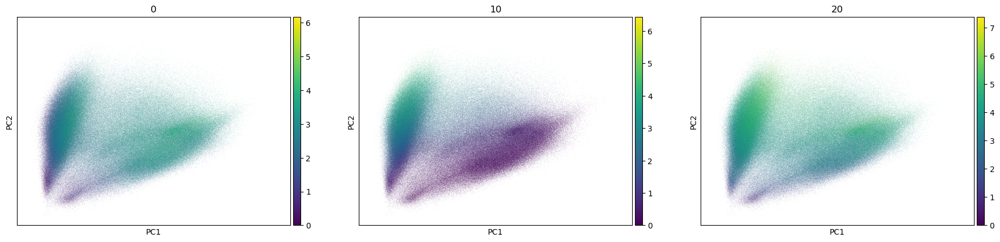

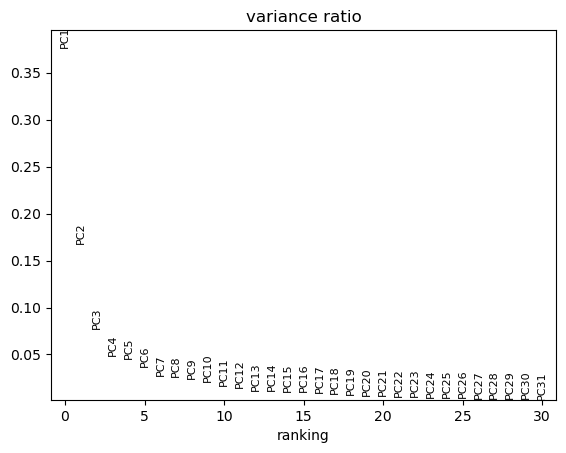

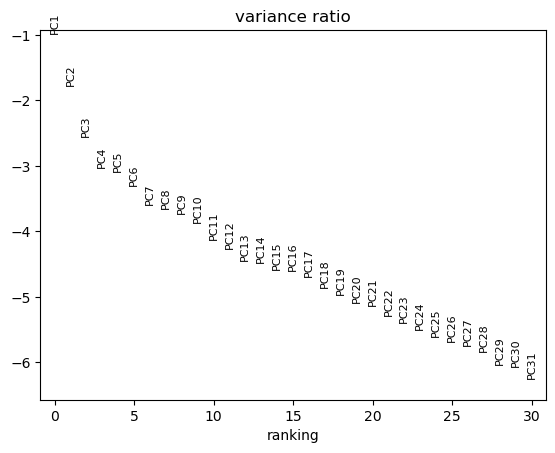

In [407]:
a_train_raw2 = ad.AnnData(z_train.numpy())
plt.style.use('default')
sc.tl.pca(a_train_raw2, svd_solver='arpack')
sc.pl.pca(a_train_raw2, color=['0', '10', '20'])
sc.pl.pca_variance_ratio(a_train_raw2)
sc.pl.pca_variance_ratio(a_train_raw2, log=True)

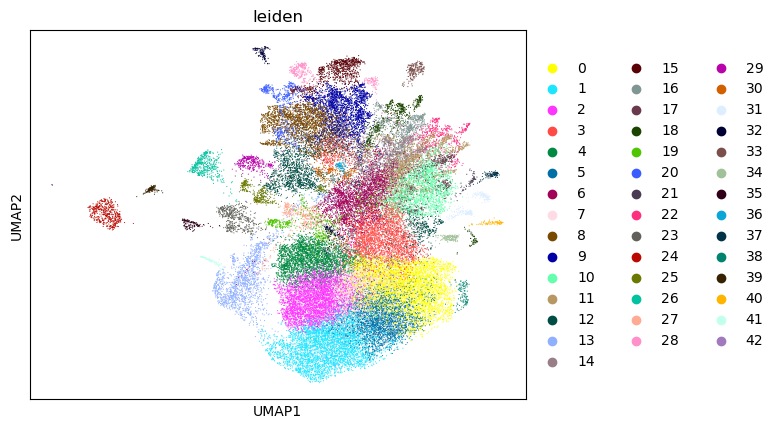

In [408]:
bigger_random_choice = np.random.choice(len(a_train_raw2), 50000, replace=False)
b2 = a_train_raw2[bigger_random_choice, :].copy()
sc.pp.neighbors(b2)  #, n_neighbors=10, n_pcs=15)
sc.tl.leiden(b2)  #, resolution=.5)
sc.tl.umap(b2)
sc.pl.umap(b2, color='leiden')

762354
50000


,leiden,patient
73059,11,32
95522,2,41
375156,18,159
554693,4,249
719582,12,360
...,...,...
251954,1,107
687358,28,340
726162,28,364
182016,19,79


saving figure in data/spatial_uzh_processed/a/coloring_by_patient.png


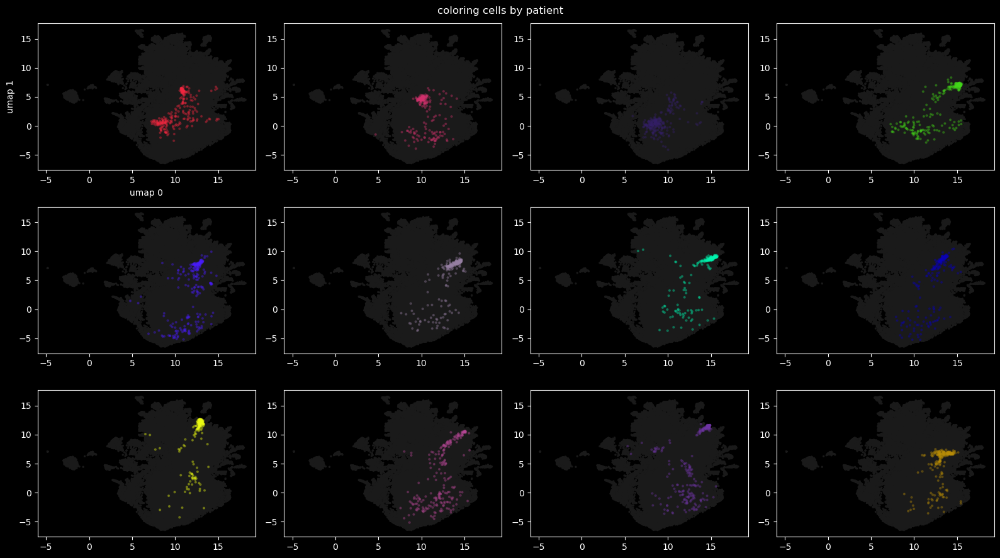

In [409]:
import pandas as pd
print(len(patient_indexes))
s = pd.Series(patient_indexes.numpy()[bigger_random_choice], dtype='category')
print(len(s))

s.index = b2.obs.index

b2.obs['patient'] = s
display(b2.obs)

# sc.pl.umap(b2, color='patient')

b2

s.index = b2.obs.index

b2.obs['patient'] = s
# display(b2.obs)

# sc.pl.umap(b2, color='patient')
u = b2.obsm['X_umap']
p = b2.obs['patient'].to_numpy()

random_colors = np.random.random((10000, 3))
c = random_colors[p, :]

plt.style.use('dark_background')

n = 12
c = 4
r = math.ceil(n / c)

fig, axes = plt.subplots(r, c, figsize=(c * 4, r * 3))
axes = axes.flatten()

unique, counts = np.unique(p, return_counts=True)
uu, cc = map(list, zip(*sorted(zip(unique, counts), key=lambda x: -x[1])))
top = uu[:n]

b = True
for i, t in enumerate(top):
    ax = axes[i]
    if b:
        b = False
        ax.set_xlabel('umap 0')
        ax.set_ylabel('umap 1')
    one_color = np.array([0.1, 0.1, 0.1, 1.]).reshape((1, 4))
    colors = np.tile(one_color, (len(u), 1))
    ax.scatter(u[:, 0], u[:, 1], c=colors, s=2)
    a = np.where(p == t)[0]
    colors[a, :3] = random_colors[t, :]
    colors[a, 3] = [0.3]
    ax.scatter(u[a, 0], u[a, 1], c=colors[a, :], s=4)
plt.suptitle('coloring cells by patient')
plt.tight_layout()
plt.style.use('default')
plt_show(plt, 'coloring_by_patient.png')

# Debugging splits

In [1]:
import os
os.chdir('/data/l989o/deployed/a')
import sys
if '/data/l989o/a' in sys.path:
    sys.path.remove('/data/l989o/a')

In [2]:
from data import RawMeanDataset
import torch

ds0 = RawMeanDataset('train')
ds1 = RawMeanDataset('validation')
ds2 = RawMeanDataset('test')

True
<KeysViewHDF5 ['count', 'maximum', 'mean', 'sum', 'variance']>


In [3]:
from tqdm import tqdm

l0 = []
for ll in tqdm(ds0):
    l0.append(ll)
x0 = torch.cat(l0, dim=0)

print(x0.shape)
print(len(x0) / len(ds0))

100%|██████████| 389/389 [00:05<00:00, 73.10it/s]


torch.Size([762354, 39])
1959.7789203084833


In [4]:
l1 = []
for ll in tqdm(ds1):
    l1.append(ll)
x1 = torch.cat(l1, dim=0)

print(x1.shape)
print(len(x1) / len(ds1))

100%|██████████| 45/45 [00:00<00:00, 328.47it/s]

torch.Size([92298, 39])
2051.0666666666666


In [5]:
l2 = []
for ll in tqdm(ds2):
    l2.append(ll)
x2 = torch.cat(l2, dim=0)

print(x2.shape)
print(len(x2) / len(ds2))

100%|██████████| 18/18 [00:00<00:00, 367.88it/s]

torch.Size([34909, 39])
1939.388888888889
